Content:<br>
* [1. Visualization of the recordings - input features](#visualization)
   * [1.1. Wave and spectrogram](#waveandspectrogram)
   * [1.2. MFCC](#mfcc)
   * [1.3. Sprectrogram in 3d](#3d)
   * [1.4. Silence removal](#resampl)
   * [1.5. Resampling - dimensionality reductions](#silenceremoval)
   * [1.6. Features extraction steps](#featuresextractionsteps)
* [2. Dataset investigation](#investigations)
   * [2.1. Number of files](#numberoffiles)
   * [2.2. Mean spectrograms and fft](#meanspectrogramsandfft)
   * [2.3. Deeper into recordings](#deeper)
   * [2.4. Length of recordings](#len)
   * [2.5. Note on Gaussian Mixtures modeling](#gmms)
   * [2.6. Frequency components across the words](#components)
   * [2.7. Anomaly detection](#anomaly)
* [3. Where to look for the inspiration](#wheretostart)

In [3]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

# Math
import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa

from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline

## 1. Visualization

**Two theories of human hearing**
+ place theory ( https://en.wikipedia.org/wiki/Place_theory_(hearing) ) (frequecy-based)
+ temporal theory ( https://en.wikipedia.org/wiki/Temporal_theory_(hearing) )

**In speech recognition, there are two main tendencies**
+ spectrogram (frequencies)
+ MFCC (Mel-Frequency Cepstral Coefficients)

### 1.1 Wave and spectrogram

In [4]:
train_audio_path = 'data/speech_recognition/train/audio/'
filename = 'yes/0a7c2a8d_nohash_0.wav'
sample_rate, samples = wavfile.read(train_audio_path + filename)

Spectrogram을 계산하는 함수를 정의하자.<br>
이 때 plot을 더 명확하게 만들기 위해 spectrogram 값에 로그(log)를 취할 것이다. 이것은 사람이 듣는 방법과도 엄밀히 연결되어 있다. 일단 로그를 취하기 전에 입력에 0 값이 없게 해야 한다.

In [5]:
def log_specgram(audio, sample_rate, window_size=20, step_size=10, eps=1e-10):
    # nperseg: Length of each segment
    # noverlap: Number of points to overlap between segments
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio, fs=sample_rate,
                                            window='hann', nperseg=nperseg,
                                            noverlap=noverlap, detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

[Nyquist theorem](https://en.wikipedia.org/wiki/Nyquist_rate) (나이키스트 샘플링 이론) 에 따르면 주파수의 범위는 (0, 8000) 이다.

Text(0.5, 0, 'Seconds')

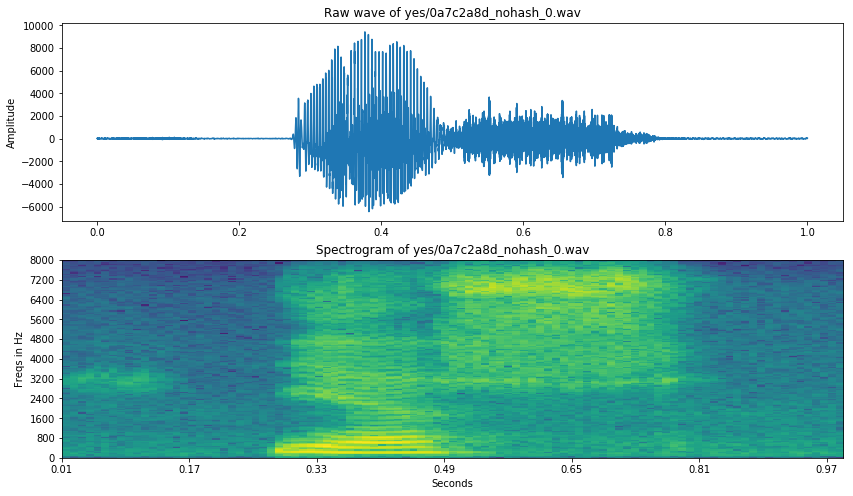

In [6]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower',
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

NeuralNet의 입력 features로 spectrogram을 사용하려면, features를 일반화(normalize)해야 한다.

In [7]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std
spectrogram.shape

(99, 161)

여기서 흥미로운 점은 각 frame이 ~160개의 features를 가지고 있다는 점이다. 주파수의 범위는 0~8000 이므로 한 feature는 50Hz에 대응한다는 것을 알 수 있다. 그러나 [귀의 주파수 해상도는 1000 ~ 2000 Hz의 옥타브(octave) 이내 3.6 Hz다.](https://en.wikipedia.org/wiki/Psychoacoustics) 이것은 사람들이 훨씬 더 정확하고 위에 spectrograms에 의해 표시된 것들보다 더 작고 자세하게 들을 수 있다는 것을 의미한다.

### 1.2 MFCC

[MFCC tutorial](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/)

*librosa* 파이썬 패키지를 사용해서 **Mel power spectrogram과 MFCC**를 계산할 수 있다.

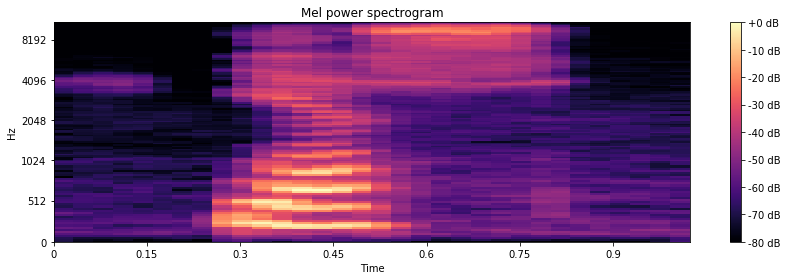

In [8]:
S = librosa.feature.melspectrogram(samples.astype(float), sr=sample_rate, n_mels=128)
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel power spectrogram')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

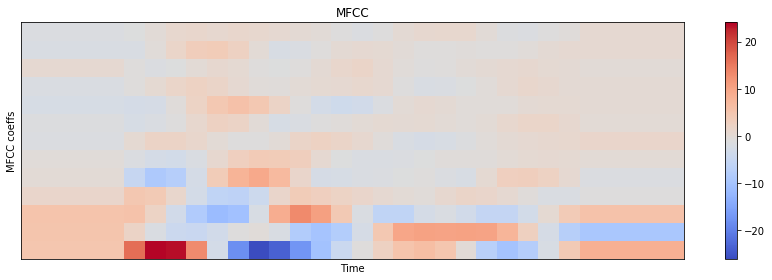

In [9]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

고전에서나 최신의 시스템에서, MFCC 또는 비슷한 features는 spectrograms 대신에 시스템의 입력으로 취해진다.

그렇지만, end-to-end(often neural-network based) 시스템에서 가장 흔한 입력 features는 아마 raw spectrograms 또는 mel power spectrograms 일 것이다. 예를 들면, MFCC는 features의 상관관계를 없앤다. 그러나 NN은 well-correlated features를 다룬다. 또한, mel 필터를 이해한다면 사용법이 합리적이라고 생각할 것이다.

사람들마다 결정이 다를 수 있다!

### 1.3 Spectrogram in 3D

In [10]:
# import IPython.display as ipd
# import plotly.graph_objs as go

data = [go.Surface(x=times, y=freqs, z=spectrogram.T)]
layout = go.Layout(
    title = 'Spectrogram of "yes" in 3D',
    scene = dict(
        yaxis = dict(title='Frequencies', range=[freqs.min(), freqs.max()]),
        xaxis = dict(title='Time', range=[times.min(), times.max()]),
        zaxis = dict(title='Log amplitude')
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

### 1.4 Silence removal

In [11]:
ipd.Audio(samples, rate=sample_rate)

silence를 제거하는 **VAD (Voice Activity Detection)**은 훈련 데이터의 크기를 줄여 훈련 속도를 크게 향상시킬 수 있다.

In [12]:
# 0.25 ~ 0.8125 * sample_rate(16000)
samples_cut = samples[4000:13000]
ipd.Audio(samples_cut, rate=sample_rate)

silence를 제거해도 "yes"가 명확히 들리는 것을 확인할 수 있다.

모든 데이터를 수동으로 자리기에는 불가능하므로 **webrtcvad** 패키지를 사용하여 VAD를 진행할 수 있다.

여기선 'y', 'e', 's' 배열을 추측해보자.

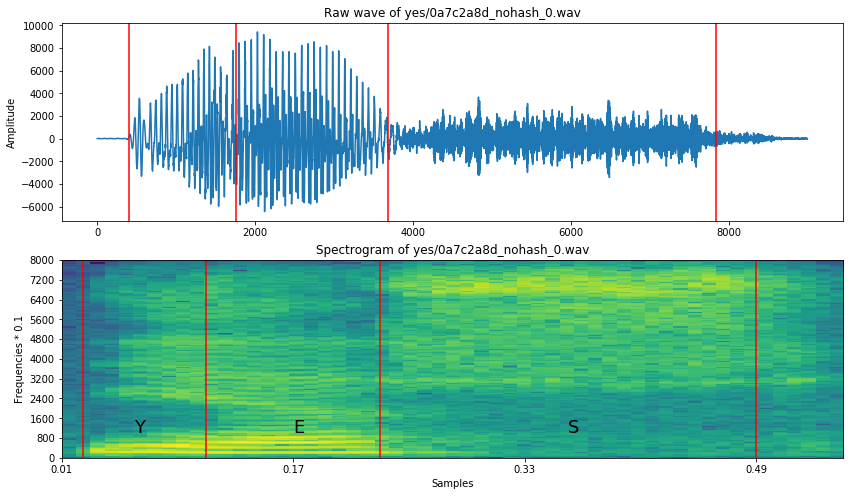

In [13]:
freqs, times, spectrogram_cut = log_specgram(samples_cut, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(samples_cut)

ax2 = fig.add_subplot(212)
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Frequencies * 0.1')
ax2.set_xlabel('Samples')
ax2.imshow(spectrogram_cut.T, aspect='auto', origin='lower',
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.text(0.06, 1000, 'Y', fontsize=18)
ax2.text(0.17, 1000, 'E', fontsize=18)
ax2.text(0.36, 1000, 'S', fontsize=18)

xcoords = [0.025, 0.11, 0.23, 0.49]
for xc in xcoords:
    ax1.axvline(x=xc*16000, c='r')
    ax2.axvline(x=xc, c='r')

### 1.5 Resampling - dimensionality reduction

데이터의 차원을 줄이는 또 다른 방법은 recordings를 resample 하는 것이다.

16k 주파수로 샘플링 되었기 때문에 recording은 자연스럽게 안 들릴 것이다. 그렇지만 speech와 가장 많이 관계된 주파수는 더 낮은 대역대에 존재한다. 그것이 8000 Hz로 샘플링된 GSM 신호인 전화 내용을 이해할 수 있는 이유다.

요약하자면, 데이터셋을 8K로 재샘플링할 수 있고 중요하지 않은 정보를 약간 버림으로써 데이터 크기를 줄일 것이다.

이것은 큰 위험이 있지만 빠른 첫 실험을 할 수 있다.

In [14]:
def custom_fft(samples, sample_rate):
    T = 1.0 / sample_rate
    N = samples.shape[0]
    yf = fft(samples)
    # start, end, num
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    # real part만 취함
    vals = 2.0/N * np.abs(yf[0:N//2])
    return xf, vals

Let's read some recording, resample it, and listen. We can also compare FFT, Notice, that there is almost no information above 4000 Hz in original signal.

In [15]:
filename = 'happy/0b09edd3_nohash_0.wav'
new_sample_rate = 8000

sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
resampled = signal.resample(samples, int(new_sample_rate/sample_rate * samples.shape[0]))

In [16]:
ipd.Audio(samples, rate=sample_rate)

In [17]:
ipd.Audio(resampled, rate=new_sample_rate)

sample rate를 반으로 줄여 샘플링 했음에도 듣기에는 별 다른 차이가 없다.

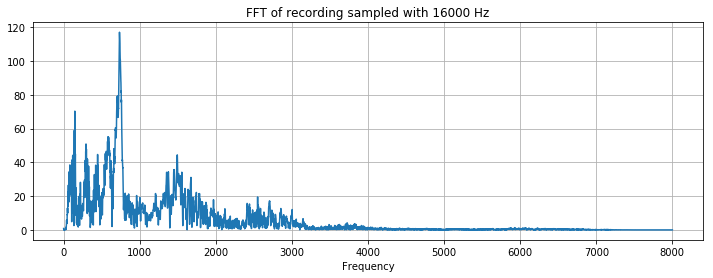

In [18]:
xf, vals = custom_fft(samples, sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

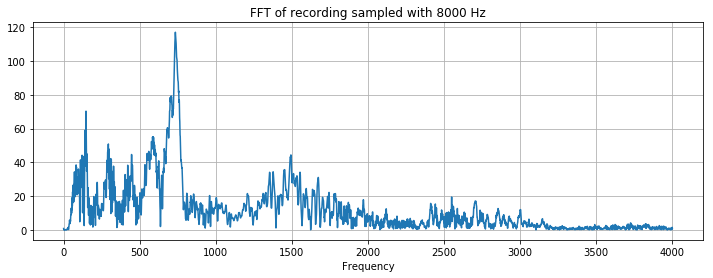

In [19]:
xf, vals = custom_fft(resampled, new_sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(new_sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

이렇게 하면 데이터셋 크기가 반으로 줄어든다.

### 1.6 Features extraction steps

**Proposed the feature extraction algorithm**
1. Resampling
2. *VAD*
3. Maybe padding with 0 to make signals be equal length
4. Log spectrogram (or *MFCC*, or *PLP*)
5. Features normalization with *mean* and *std*
6. Stacking of a given number of frames to get temporal information 

## 2. Dataset investigation

### 2.1 Number of records

In [20]:
dirs = [f for f in os.listdir(train_audio_path) if isdir(join(train_audio_path, f))]
dirs.sort()
print('Number of labels: ' + str(len(dirs)))

Number of labels: 31


In [21]:
number_of_recordings = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    number_of_recordings.append(len(waves))

data = [go.Histogram(x=dirs, y=number_of_recordings)]
trace = go.Bar(
    x = dirs,
    y = number_of_recordings,
    marker=dict(color=number_of_recordings, colorscale='Viridis', showscale=True)
)
layout = go.Layout(
    title = 'Number of recordings in given label',
    xaxis = dict(title='Words'),
    yaxis = dict(title='Number of recordings')
)
py.iplot(go.Figure(data=[trace], layout=layout))

데이터셋은 backgroud_noise(6개)를 제외하곤 대체적으로 균형있는 모습이다.

### 2.2 Deeper into recordings

매우 중요한 사실이 있다. Recordings는 매우 다른 sources에서 생성됐다. 이것들 중 약간은 mobile GSM 채널에서 생성되었을 수 있다.

그럼에도 불구하고, **하나의 스피커에서 발생한 것이 훈련과 테스트셋 둘 다에 있지 않도록 나누는 것이 매우 중요하다.**

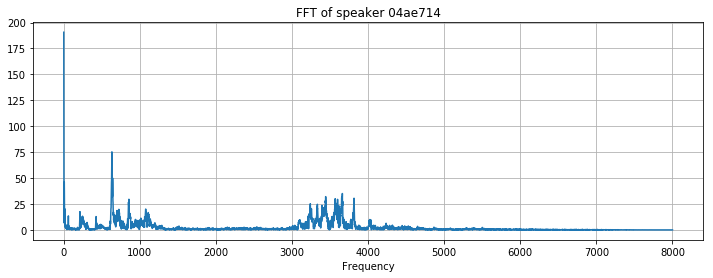

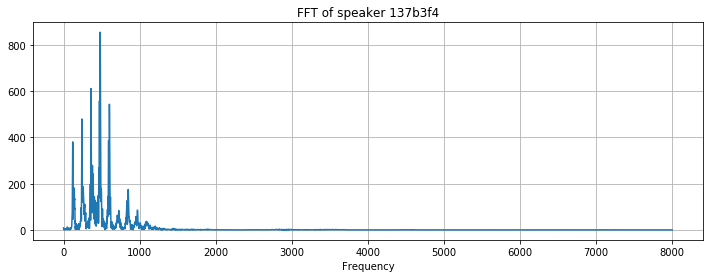

In [22]:
filenames = ['on/004ae714_nohash_0.wav', 'on/0137b3f4_nohash_0.wav']
for filename in filenames:
    sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
    xf, vals = custom_fft(samples, sample_rate)
    plt.figure(figsize=(12, 4))
    plt.title('FFT of speaker ' + filename[4:11])
    plt.plot(xf, vals)
    plt.xlabel('Frequency')
    plt.grid()
    plt.show()

In [23]:
print('Speaker ' + filenames[0][4:11])
sample_rate, samples = wavfile.read(str(train_audio_path) + filenames[0])
ipd.Audio(samples, rate=sample_rate)

Speaker 04ae714


In [24]:
print('Speaker ' + filenames[1][4:11])
sample_rate, samples = wavfile.read(str(train_audio_path) + filenames[1])
ipd.Audio(samples, rate=sample_rate)

Speaker 137b3f4


약간의 이상한 침묵(silence)를 가진 recordings도 있다.

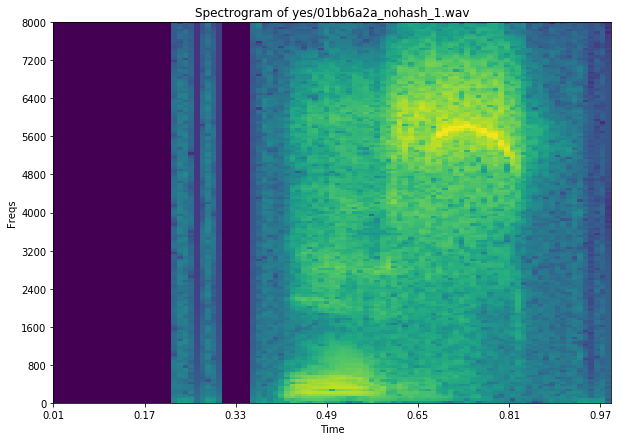

In [25]:
filename = 'yes/01bb6a2a_nohash_1.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
freqs, times, spectrogram = log_specgram(samples, sample_rate)

plt.figure(figsize=(10, 7))
plt.title('Spectrogram of ' + filename)
plt.ylabel('Freqs')
plt.xlabel('Time')
plt.imshow(spectrogram.T, aspect='auto', origin='lower',
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.yticks(freqs[::16])
plt.xticks(times[::16])
plt.show()

In [26]:
ipd.Audio(samples, rate=sample_rate)

### 2.3 Recordings length

모든 파일 중 길이가 1초 이하인 파일들을 찾아보자.

In [28]:
num_of_shorter = 0
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] < sample_rate:
            num_of_shorter += 1
print('Number of recordings shorter than 1 second: ' + str(num_of_shorter))

c:\users\yeongjoon\appdata\local\continuum\anaconda3\envs\venv\lib\site-packages\scipy\io\wavfile.py:273: WavFileWarning:

Chunk (non-data) not understood, skipping it.



Number of recordings shorter than 1 second: 6469


놀랍게도, 많이 있었다. 그것들을 zeros로 padding 할 수 있다.

### 2.4 Mean spectrograms and FFT

모든 단어의 평균 FFT를 plot 해보자.

['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']


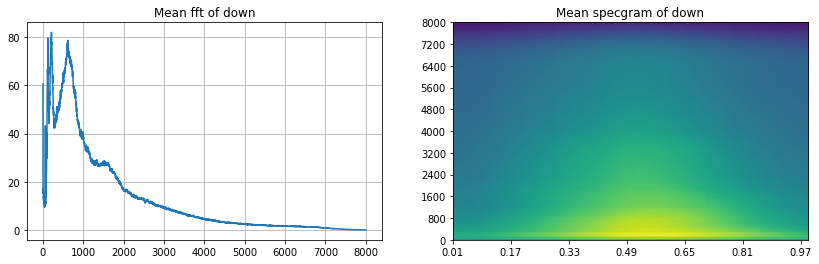

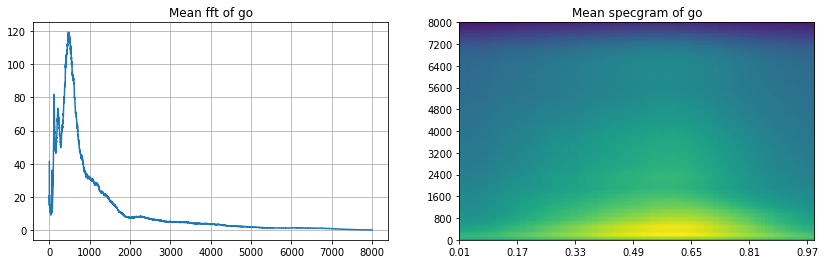

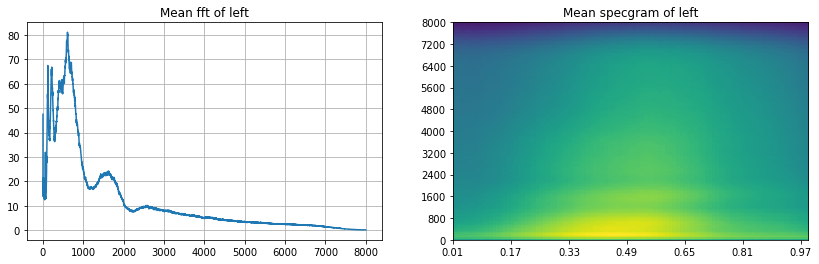

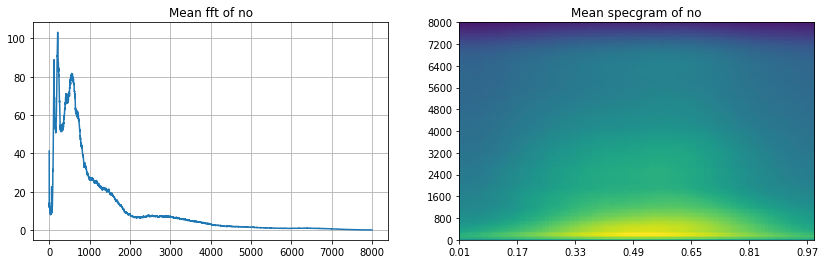

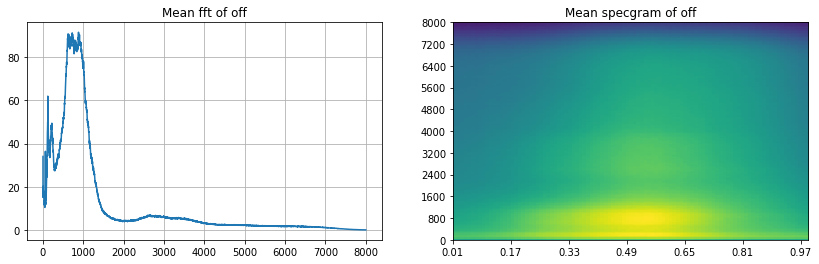

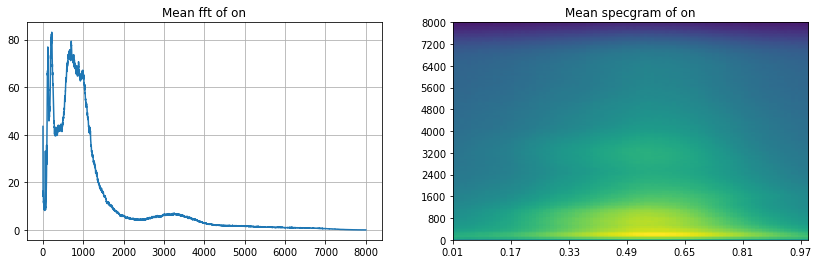

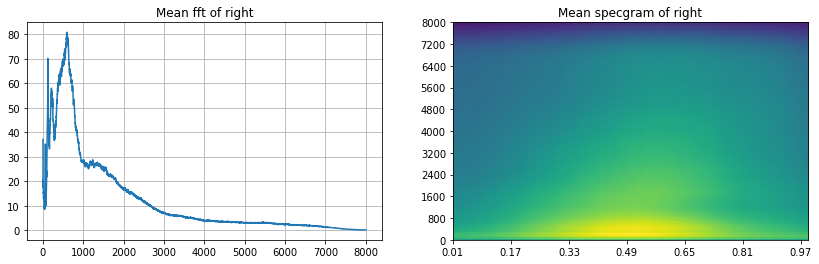

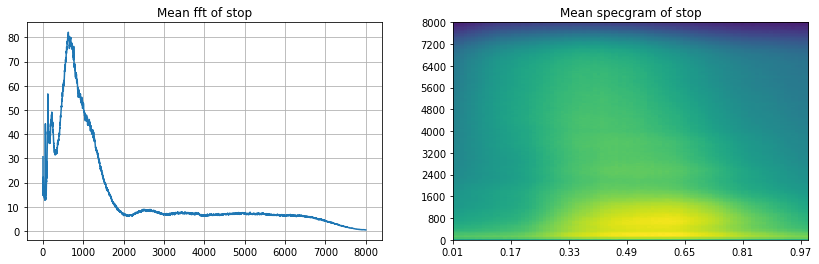

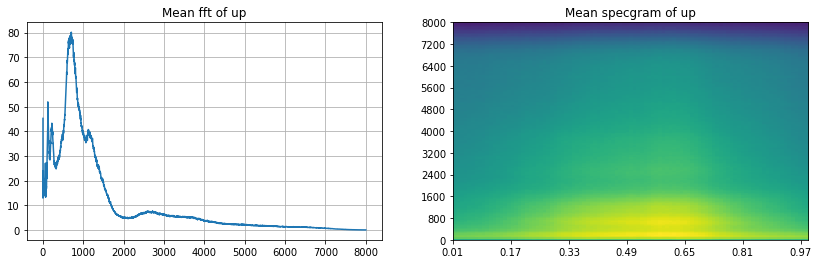

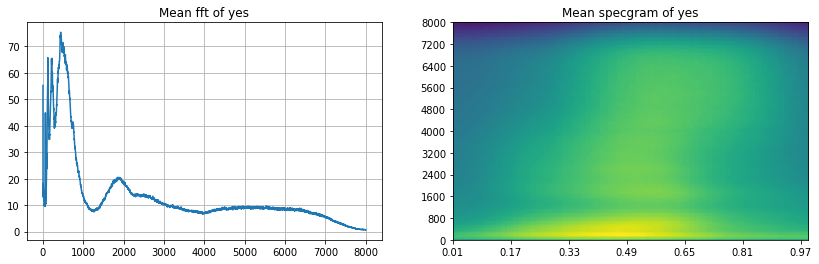

In [29]:
to_keep = 'yes no up down left right on off stop go'.split()
dirs = [d for d in dirs if d in to_keep]
print(dirs)

for direct in dirs:
    vals_all = []
    spec_all = []
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] != 16000:
            continue
        xf, vals = custom_fft(samples, 16000)
        vals_all.append(vals)
        freqs, times, spec = log_specgram(samples, 16000)
        spec_all.append(spec)
        
    plt.figure(figsize=(14, 4))
    plt.subplot(121)
    plt.title('Mean fft of ' + direct)
    plt.plot(np.mean(np.array(vals_all), axis=0))
    plt.grid()
    plt.subplot(122)
    plt.title('Mean specgram of ' + direct)
    plt.imshow(np.mean(np.array(spec_all), axis=0).T, aspect='auto', origin='lower',
               extent=[times.min(), times.max(), freqs.min(), freqs.max()])
    plt.yticks(freqs[::16])
    plt.xticks(times[::16])
    plt.show()

### 2.5 Gaussian Mixtures modeling

평균 FFT는 매 단어에서 차이가 있다는 것을 볼 수 있다. Gaussian 분포의 mixture로 각 FFT를 모델화할 수 있다. 그러나 몇몇은 FFT 그래프를 봤을 때 거의 동일해보인다. 그러나 spectrogram을 봤을 때는 어느 정도 구분할 수 있다. `stop`과 `up`을 보면 FFT는 거의 동일해보이지만 spectrogram을 보면 높은 주파수가 확연히 보인다.

이것이 temporal 구성요소가 필요한 이유다. **Kaldi** 라이브러리를 사용해서, GMM으로 단어들을 모델링할 수 있고 **Hidden Markov Models**로 temporal 의존성을 모델링할 수 있다.

우리가 무엇을 모델화할 수 있고 얼마나 단어들을 구별하기 어려운지 확인하기 위해 단어에 대해 간단한 GMM을 사용할 수 있다. 이것을 하는데 **Scikit-learn**을 사용할 수 있지만 쉽지 않고 (not straightforward) 여기서 다루기에는 너무 길다. 따라서 지금은 이 아이디어를 버린다.

### 2.6 Frequency components across the words

In [30]:
def violinplot_frequency(dirs, freq_ind):
    """ Plot violinplots for given words (waves in dirs) and frequency freq_ind
    from all frequencies freqs."""
    
    spec_all = []
    ind = 0
    for direct in dirs:
        spec_all.append([])
        waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
        for wav in waves[:100]:
            sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
            freqs, times, spec = log_specgram(samples, sample_rate)
            spec_all[ind].extend(spec[:, freq_ind])
        ind += 1
    
    minimum = min([len(spec) for spec in spec_all])
    spec_all = np.array([spec[:minimum] for spec in spec_all])
    
    plt.figure(figsize=(13, 7))
    plt.title('Frequency ' + str(freqs[freq_ind]) + ' Hz')
    plt.ylabel('Amount of frequency in a word')
    plt.xlabel('Words')
    sns.violinplot(data=pd.DataFrame(spec_all.T, columns=dirs))
    plt.show()

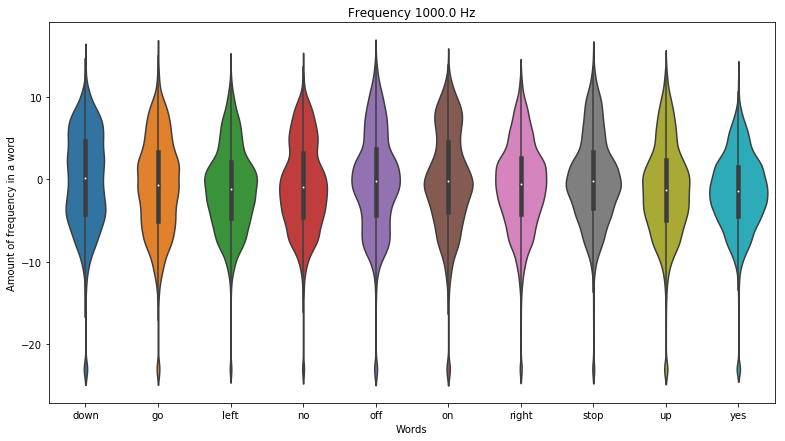

In [31]:
violinplot_frequency(dirs, 20)

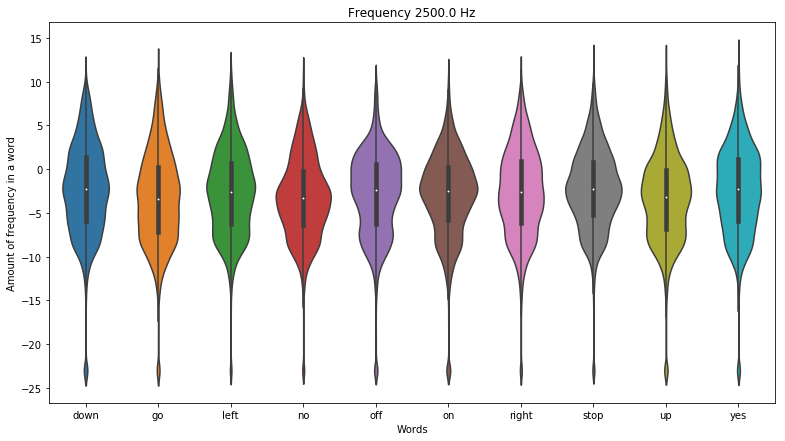

In [32]:
violinplot_frequency(dirs, 50)

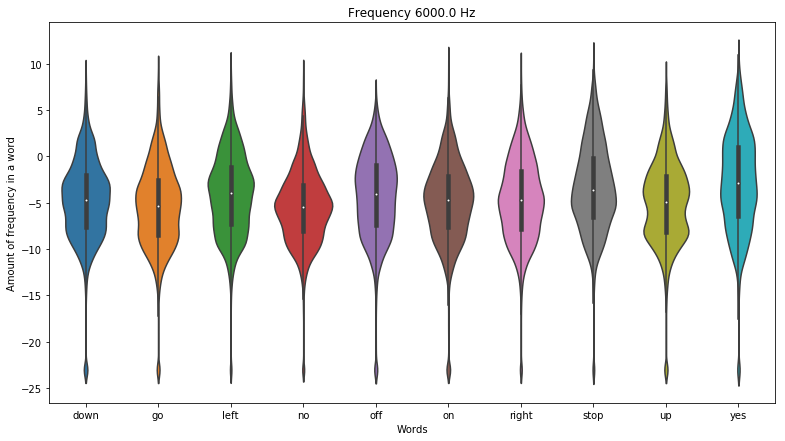

In [33]:
violinplot_frequency(dirs, 120)

### 2.7 Anomaly detection

우리는 다소 눈에 띄지 않은 어떤 recordings이 있는지 확인해야 한다. 그래야 데이터셋의 차원을 더 낮출수 있고 어떠한 변칙을 상호작용적으로 확인할 수 있다. 이제 차원 감소를 위해 PCA를 사용할 것이다.

In [34]:
fft_all = []
names = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] != sample_rate:
            samples = np.append(samples, np.zeros((sample_rate - samples.shape[0], )))
        x, val = custom_fft(samples, sample_rate)
        fft_all.append(val)
        names.append(direct + '/' + wav)

fft_all = np.array(fft_all)

# Normalization
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)

# Dim reduction
pca = PCA(n_components=3)
fft_all = pca.fit_transform(fft_all)

def interactive_3d_plot(data, names):
    scatt = go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2], mode='markers', text=names)
    data = go.Data([scatt])
    layout = go.Layout(title="Anomaly detection")
    figure = go.Figure(data=data, layout=layout)
    py.iplot(figure)
    
interactive_3d_plot(fft_all, names)

c:\users\yeongjoon\appdata\local\continuum\anaconda3\envs\venv\lib\site-packages\plotly\graph_objs\_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




*go/0487ba9b_nohash_0.wav, yes/e4b02540_nohash_0.wav*를 들어보면 나머지와 동떨어진 느낌이 들 것이다.

In [35]:
print('Recording go/0487ba9b_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'go/0487ba9b_nohash_0.wav'))

Recording go/0487ba9b_nohash_0.wav


In [36]:
print('Recording yes/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'yes/e4b02540_nohash_0.wav'))

Recording yes/e4b02540_nohash_0.wav


만약 개별 단어에서 변칙들을 찾을 것이라면 *seven*의 이 파일을 예시로 들 수 있다.

In [37]:
print('Recording seven/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'seven/b1114e4f_nohash_0.wav'))

Recording seven/e4b02540_nohash_0.wav
